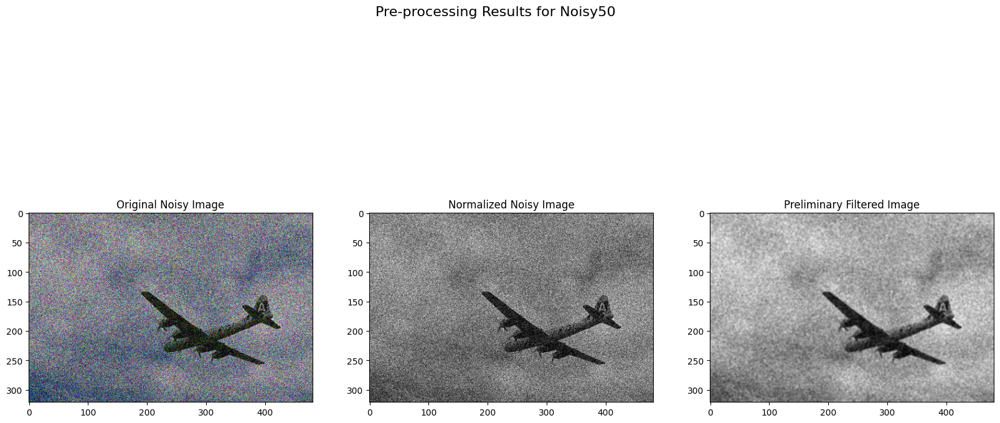

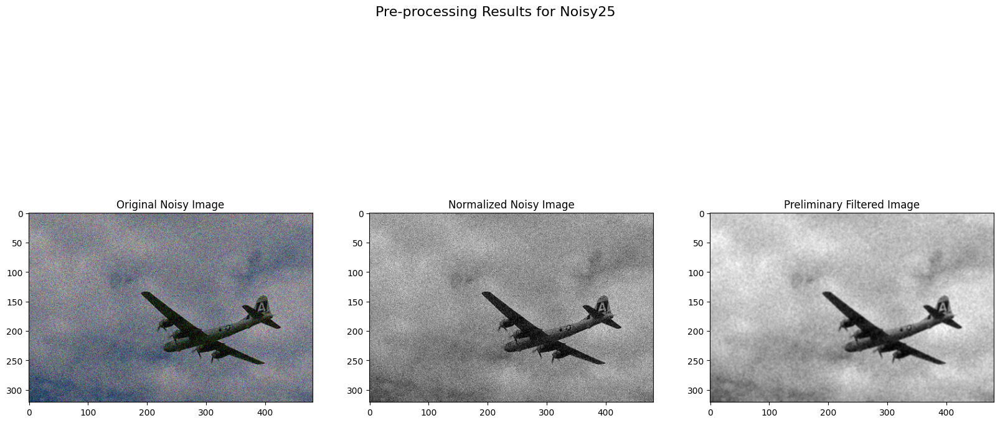

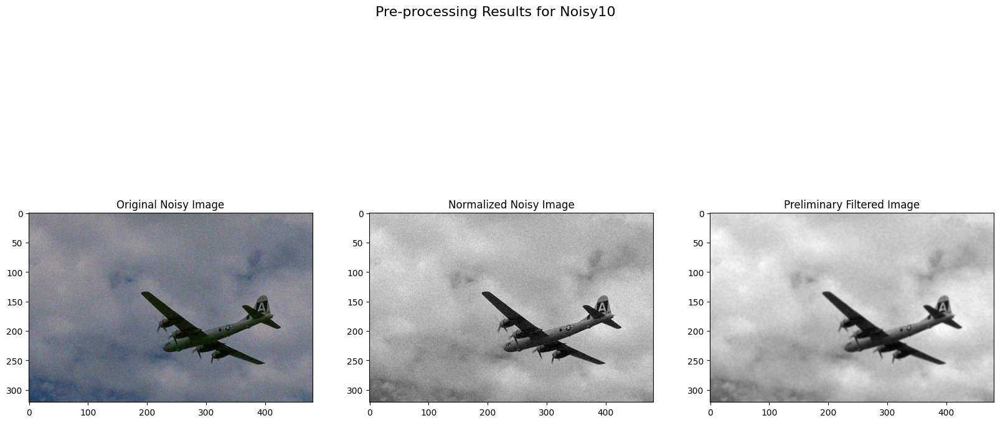

In [29]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Path to noisy image folders
noisy_folders = {
    'Noisy50': 'noisy50',
    'Noisy25': 'noisy25',
    'Noisy10': 'noisy10'
}

# Function to normalize image intensities
def normalize_image(image):
    image_float = np.float32(image)
    return cv2.normalize(image_float, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)

# Function to apply a preliminary noise reduction filter (e.g., Gaussian blur)
def preliminary_filter(image):
    return cv2.GaussianBlur(image, (5, 5), 0)

# Process all images in each folder
for noise_level, folder in noisy_folders.items():
    folder_path = Path(folder)
    
    # Check if the folder path exists
    if not folder_path.is_dir():
        print(f"Folder {folder} does not exist.")
        continue

    # Create a separate folder for each noise level's pre-processed images
    preprocessed_folder = Path(f'preprocessed_{noise_level}')
    preprocessed_folder.mkdir(exist_ok=True)

    # Iterate over all image files in the folder
    for image_file in folder_path.glob('*.png'):
        # Read the image in grayscale for processing
        noisy_image = cv2.imread(str(image_file), 0)
        
        # Apply pre-processing steps
        normalized_noisy_image = normalize_image(noisy_image)
        prelim_filtered_image = preliminary_filter(normalized_noisy_image)

        # Save the pre-processed images to the preprocessed folder
        cv2.imwrite(str(preprocessed_folder / f'prelim_filtered_{image_file.name}'), prelim_filtered_image * 255) # Convert back to 0-255 range

        # Display the first image's results for demonstration
        if image_file == next(folder_path.glob('*.png')):
            noisy_image_color = cv2.imread(str(image_file))
            noisy_image_color = cv2.cvtColor(noisy_image_color, cv2.COLOR_BGR2RGB)

            plt.figure(figsize=(20, 10))
            plt.suptitle(f'Pre-processing Results for {noise_level}', fontsize=16)

            plt.subplot(1, 3, 1)
            plt.imshow(noisy_image_color)  # Display the original noisy image in color
            plt.title('Original Noisy Image')

            plt.subplot(1, 3, 2)
            plt.imshow(normalized_noisy_image, cmap='gray')
            plt.title('Normalized Noisy Image')

            plt.subplot(1, 3, 3)
            plt.imshow(prelim_filtered_image, cmap='gray')
            plt.title('Preliminary Filtered Image')
            plt.show()

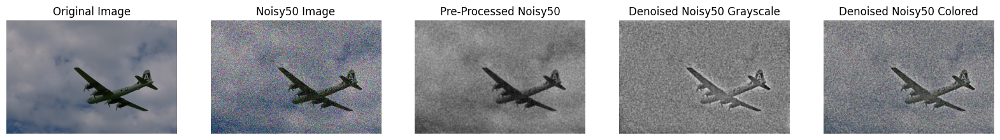

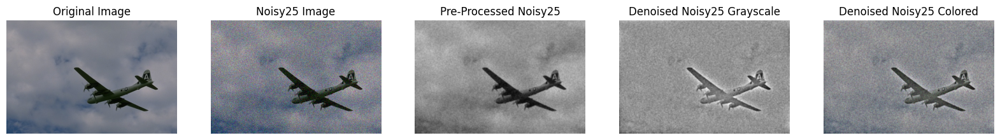

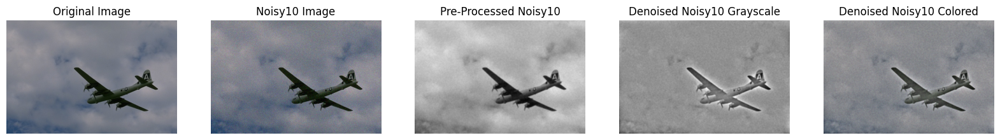

In [30]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from numpy.fft import fft2, ifft2, fftshift, ifftshift
 
def wiener_filter(img, K=0.01):
    # Fourier Transform-based Wiener filter
    # The concept of using Fourier Transform for image denoising is inspired by:
    # [1] Richard Wenzhe Xu. "Techniques and Applications of Image Denoising" [l1j2b-richard-wenzhe_xu.pdf]
    # [3] Navarro, L., & Molimard, J. (2019). Directional Denoising Using Fourier Spectrum Cloning [66464.pdf]
    img_fft = fftshift(fft2(img))
    H, W = img.shape
    U, V = np.meshgrid(np.arange(-W//2, W//2), np.arange(-H//2, H//2))

    # Low pass filter with a small constant added to the denominator
    epsilon = 1e-8  # Small constant to prevent division by zero
    D0 = 10  # Cutoff frequency
    H_uv = 1 / (1 + (D0 / (np.sqrt(U**2 + V**2) + epsilon))**2)

    # Apply filter
    G_uv = img_fft * H_uv
    G_uv = ifftshift(G_uv)  # Shift back
    img_back = ifft2(G_uv)
    img_back = np.real(img_back)

    return img_back

# Function to load an image from a given path
def load_image(path):
    image = cv2.imread(str(path))
    if image is None:
        print(f"Error: Unable to load image at {path}")
    return image

# Function to display the images
def display_images(images, titles):
    plt.figure(figsize=(20, 10))
    for i, (image, title) in enumerate(zip(images, titles), 1):
        plt.subplot(1, len(images), i)
        if image is not None:
            if image.ndim == 2:
                plt.imshow(image, cmap='gray')
            else:
                plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis('off')
    plt.show()

# Paths to the folders
original_folder = 'original'
noisy_folders = {
    'Noisy50': 'noisy50',
    'Noisy25': 'noisy25',
    'Noisy10': 'noisy10'
}
preprocessed_folders = {
    'Noisy50': 'preprocessed_Noisy50',
    'Noisy25': 'preprocessed_Noisy25',
    'Noisy10': 'preprocessed_Noisy10'
}

# Create separate output folders for each noise level
output_folders = {
    'Noisy50': Path('denoised_Noisy50'),
    'Noisy25': Path('denoised_Noisy25'),
    'Noisy10': Path('denoised_Noisy10')
}
for folder in output_folders.values():
    folder.mkdir(parents=True, exist_ok=True)

# Process images from each folder
for noise_level in ['Noisy50', 'Noisy25', 'Noisy10']:
    original_images = sorted(Path(original_folder).glob('*.png'))
    noisy_images = sorted(Path(noisy_folders[noise_level]).glob('*.png'))
    preprocessed_images = sorted(Path(preprocessed_folders[noise_level]).glob('*.png'))

    for i, preprocessed_image_path in enumerate(preprocessed_images):
        noisy_image_path = noisy_images[i]
        original_image_path = original_images[i % len(original_images)]

        # Load images
        original_image = load_image(original_image_path)
        noisy_image = load_image(noisy_image_path)
        preprocessed_image = load_image(preprocessed_image_path)

        if preprocessed_image is not None:
            preprocessed_image_gray = cv2.cvtColor(preprocessed_image, cv2.COLOR_BGR2GRAY)
            denoised_grayscale = wiener_filter(preprocessed_image_gray)
            denoised_grayscale = cv2.normalize(denoised_grayscale, None, 0, 255, cv2.NORM_MINMAX)
            denoised_grayscale = np.uint8(denoised_grayscale)
            denoised_colored = cv2.cvtColor(denoised_grayscale, cv2.COLOR_GRAY2BGR)
            denoised_colored = cv2.addWeighted(denoised_colored, 0.6, noisy_image, 0.4, 0)

            # Save the denoised image in the corresponding output folder
            save_path = output_folders[noise_level] / f'denoised_{preprocessed_image_path.name}'
            cv2.imwrite(str(save_path), denoised_colored)

        # Display the first set of images from each noise level
        if i == 0:
            images_to_display = [original_image, noisy_image, preprocessed_image, denoised_grayscale, denoised_colored]
            titles = ['Original Image', f'{noise_level} Image', f'Pre-Processed {noise_level}', f'Denoised {noise_level} Grayscale', f'Denoised {noise_level} Colored']
            display_images(images_to_display, titles)

# General Citations:
# This implementation is inspired by techniques discussed in the following papers:
# [1] Richard Wenzhe Xu. "Techniques and Applications of Image Denoising" [l1j2b-richard-wenzhe_xu.pdf]
# [2] Naveen S., Aiswarya V. A. (2015). Image Denoising by Fourier Block Processing and Wiener Filtering [1-s2.0-S1877050915021997-main.pdf]
# [3] Navarro, L., & Molimard, J. (2019). Directional Denoising Using Fourier Spectrum Cloning [66464.pdf]

## Comparison of Algorithms

Comparing the Fourier Transform-based Wiener filter algorithm with the following denoising methods:
- Mean filter
- Median filter
- Wavelet denoising

#### Mean Filter
The Mean Filter is a simple, intuitive way to denoise images. It replaces each pixel's value with the average value of its neighbors, including itself. This method tends to blur the image, reducing the noise level but at the cost of losing image details.

1. Applied the Mean Filter to the given noisy images with different noise levels.
2. The filtered images are displayed to visualize the noise reduction effect.
3. Additionally, Fourier transformation results are presented to quantitatively compare the noise reduction and preservation of image features.

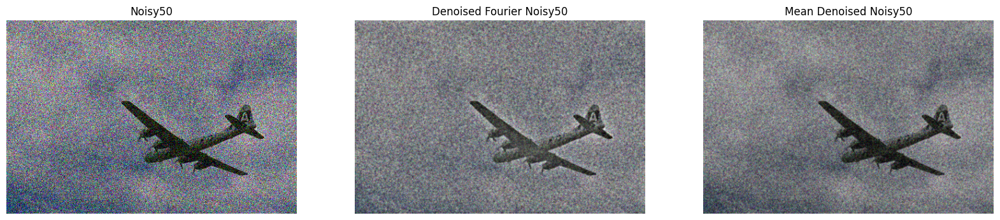

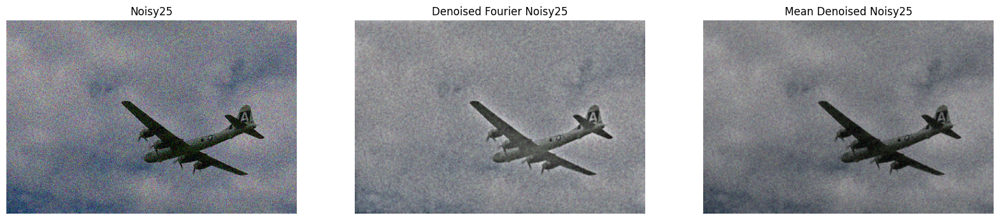

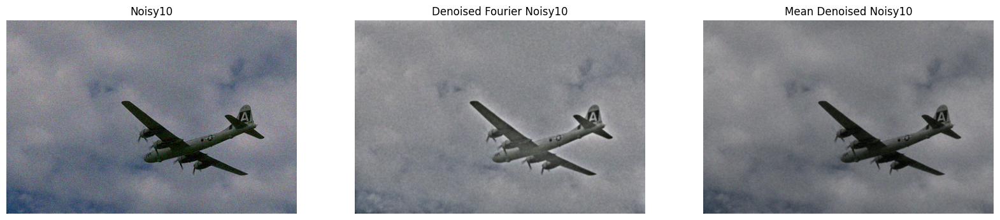

In [31]:
def mean_filter(img, kernel_size=3):
    return cv2.blur(img, (kernel_size, kernel_size))

def display_images(images, titles):
    plt.figure(figsize=(20, 10))
    for i, (image, title) in enumerate(zip(images, titles), 1):
        plt.subplot(1, len(images), i)
        if image is not None:
            if image.ndim == 2:
                plt.imshow(image, cmap='gray')
            else:
                plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis('off')
    plt.show()

# Paths to the folders
noisy_folders = {
    'Noisy50': 'noisy50',
    'Noisy25': 'noisy25',
    'Noisy10': 'noisy10'
}
denoised_folders = {
    'Noisy50': 'denoised_Noisy50',
    'Noisy25': 'denoised_Noisy25',
    'Noisy10': 'denoised_Noisy10'
}

# Apply Mean Filter to the noisy images and display the results
for noise_level in ['Noisy50', 'Noisy25', 'Noisy10']:
    noisy_images = sorted(Path(noisy_folders[noise_level]).glob('*.png'))
    denoised_images = sorted(Path(denoised_folders[noise_level]).glob('*.png'))
    
    for i, noisy_image_path in enumerate(noisy_images):
        noisy_image = load_image(noisy_image_path)
        denoised_image_path = denoised_images[i]
        denoised_image = load_image(denoised_image_path)

        # Apply Mean filter to the noisy image
        noisy_image_gray = cv2.cvtColor(noisy_image, cv2.COLOR_BGR2GRAY)
        denoised_mean = mean_filter(noisy_image_gray)
        denoised_mean_colored = cv2.cvtColor(denoised_mean, cv2.COLOR_GRAY2BGR)

        if i == 0:  # Display the first image's result
            denoised_colored = cv2.cvtColor(denoised_mean_colored, cv2.COLOR_BGR2RGB)
            denoised_colored = cv2.addWeighted(denoised_colored, 0.6, noisy_image, 0.4, 0)
            images_to_display = [
                noisy_image, 
                denoised_image, 
                denoised_colored           
            ]
            titles = [f'{noise_level}', f'Denoised Fourier {noise_level}', f'Mean Denoised {noise_level}']
            display_images(images_to_display, titles)


#### Median Filter
The Median Filter is a non-linear filter that is particularly effective at removing 'salt and pepper' noise. Each pixel's value is replaced by the median value of its neighbors. This method preserves edges better than the Mean Filter.
1. Applied the Median Filter to the noisy images with varying noise levels.
2. The denoised images obtained from the Median Filter are displayed for visual inspection.
3. Fourier transformation results are included to assess the effectiveness of noise reduction and preservation of image features.

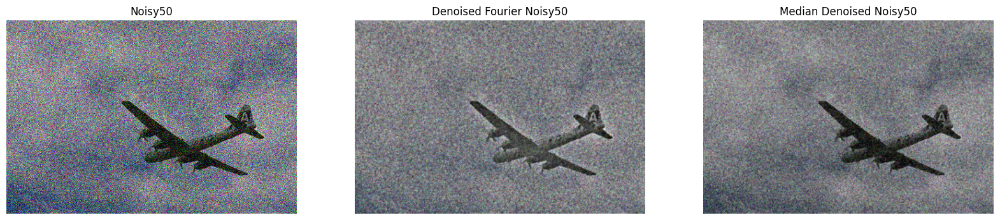

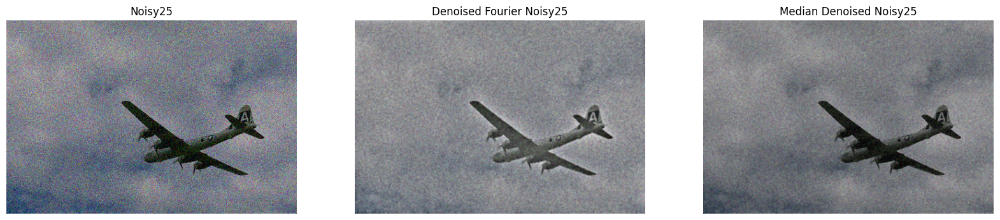

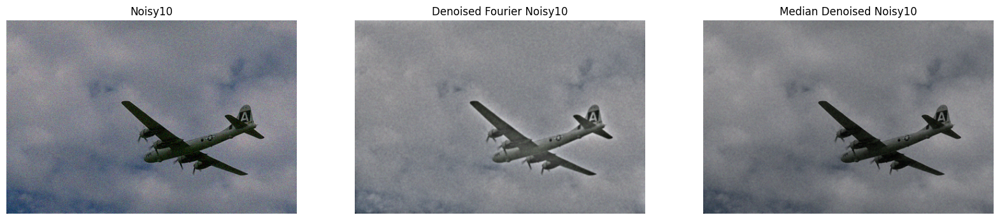

In [32]:
def median_filter(img, kernel_size=3):
    return cv2.medianBlur(img, kernel_size)

def display_images(images, titles):
    plt.figure(figsize=(20, 10))
    for i, (image, title) in enumerate(zip(images, titles), 1):
        plt.subplot(1, len(images), i)
        if image is not None:
            if image.ndim == 2:
                plt.imshow(image, cmap='gray')
            else:
                plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis('off')
    plt.show()

# Paths to the folders
noisy_folders = {
    'Noisy50': 'noisy50',
    'Noisy25': 'noisy25',
    'Noisy10': 'noisy10'
}
denoised_folders = {
    'Noisy50': 'denoised_Noisy50',
    'Noisy25': 'denoised_Noisy25',
    'Noisy10': 'denoised_Noisy10'
}

# Apply Median Filter to the noisy images and display the results
for noise_level in ['Noisy50', 'Noisy25', 'Noisy10']:
    noisy_images = sorted(Path(noisy_folders[noise_level]).glob('*.png'))
    denoised_images = sorted(Path(denoised_folders[noise_level]).glob('*.png'))
    
    for i, noisy_image_path in enumerate(noisy_images):
        noisy_image = load_image(noisy_image_path)
        denoised_image_path = denoised_images[i]
        denoised_image = load_image(denoised_image_path)

        # Apply Median filter to the noisy image
        noisy_image_gray = cv2.cvtColor(noisy_image, cv2.COLOR_BGR2GRAY)
        denoised_median = median_filter(noisy_image_gray)
        denoised_median_colored = cv2.cvtColor(denoised_median, cv2.COLOR_GRAY2BGR)

        if i == 0:  # Display the first image's result
            denoised_colored = cv2.addWeighted(denoised_median_colored, 0.6, noisy_image, 0.4, 0)
            images_to_display = [
                noisy_image, 
                denoised_image, 
                denoised_colored           
            ]
            titles = [f'{noise_level}', f'Denoised Fourier {noise_level}', f'Median Denoised {noise_level}']
            display_images(images_to_display, titles)


#### Wavelet Denoising (VisuShrink)
Wavelet denoising, particularly the VisuShrink method, aims to remove noise by applying a wavelet transform. The wavelet coefficients are then thresholded, and an inverse wavelet transform is applied. This method is effective for images with varying noise levels across different regions.
1. Applied VisuShrink Wavelet Denoising to the noisy images with different noise levels.
2. The denoised images are displayed to visualize the impact of the denoising process.
3. Fourier transformation results are presented to quantitatively evaluate the noise reduction and image detail preservation achieved by VisuShrink Wavelet Denoising.

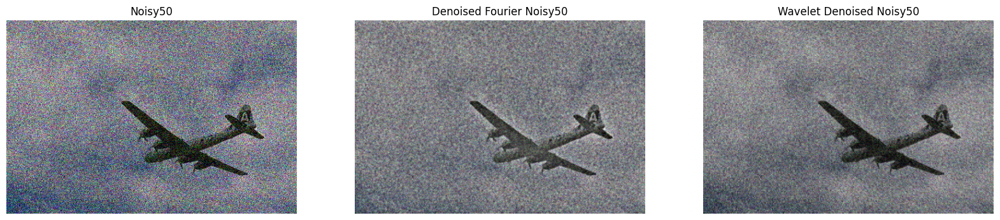

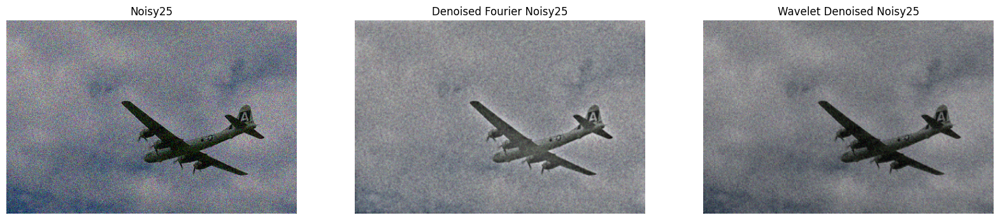

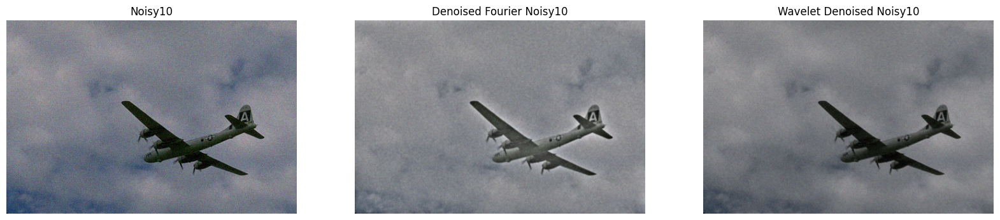

In [33]:
import pywt

def visushrink_denoising(img):
    coeffs2 = pywt.dwt2(img, 'db1')
    cA, (cH, cV, cD) = coeffs2
    sigma = np.median(np.abs(cD)) / 0.6745
    threshold = sigma * np.sqrt(2 * np.log(img.size))
    cH = pywt.threshold(cH, threshold, mode='soft')
    cV = pywt.threshold(cV, threshold, mode='soft')
    cD = pywt.threshold(cD, threshold, mode='soft')
    return pywt.idwt2((cA, (cH, cV, cD)), 'db1')

def display_images(images, titles):
    plt.figure(figsize=(20, 10))
    for i, (image, title) in enumerate(zip(images, titles), 1):
        plt.subplot(1, len(images), i)
        if image is not None:
            if image.ndim == 2:
                plt.imshow(image, cmap='gray')
            else:
                plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis('off')
    plt.show()

# Paths to the folders
noisy_folders = {
    'Noisy50': 'noisy50',
    'Noisy25': 'noisy25',
    'Noisy10': 'noisy10'
}
denoised_folders = {
    'Noisy50': 'denoised_Noisy50',
    'Noisy25': 'denoised_Noisy25',
    'Noisy10': 'denoised_Noisy10'
}

# Apply VisuShrink Wavelet Denoising to the noisy images and display the results
for noise_level in ['Noisy50', 'Noisy25', 'Noisy10']:
    noisy_images = sorted(Path(noisy_folders[noise_level]).glob('*.png'))
    denoised_images = sorted(Path(denoised_folders[noise_level]).glob('*.png'))
    
    for i, noisy_image_path in enumerate(noisy_images):
        noisy_image = load_image(noisy_image_path)
        denoised_image_path = denoised_images[i]
        denoised_image = load_image(denoised_image_path)

        # Apply VisuShrink Wavelet Denoising to the noisy image
        noisy_image_gray = cv2.cvtColor(noisy_image, cv2.COLOR_BGR2GRAY)
        denoised_wavelet = visushrink_denoising(noisy_image_gray)
        
        # Convert denoised_wavelet to 8-bit unsigned integer
        denoised_wavelet = cv2.convertScaleAbs(denoised_wavelet)
        
        # Resize denoised_colored to match the size of noisy_image
        denoised_wavelet_colored_resized = cv2.resize(denoised_wavelet, (noisy_image.shape[1], noisy_image.shape[0]))
        
        if i == 0:  # Display the first image's result
            denoised_colored = cv2.cvtColor(denoised_wavelet_colored_resized, cv2.COLOR_BGR2RGB)
            denoised_colored = cv2.addWeighted(denoised_colored, 0.6, noisy_image, 0.4, 0)
            images_to_display = [
                noisy_image, 
                denoised_image, 
                denoised_colored           
            ]
            titles = [f'{noise_level}', f'Denoised Fourier {noise_level}', f'Wavelet Denoised {noise_level}']
            display_images(images_to_display, titles)


## Comparison of Original and Denoised Images

### Mean Squared Error (MSE)
The Mean Squared Error (MSE) is a measure of the average squared difference between the original and denoised images. It quantifies the amount of error introduced by the denoising process. Lower MSE values indicate better denoising performance, with an MSE of 0 representing a perfect match to the original image.

### Structural SIMilarity (SSIM) Index
The Structural SIMilarity (SSIM) index measures the similarity between two images in terms of luminance, contrast, and structure. Unlike MSE, which measures absolute errors, SSIM considers changes in structural information, luminance, and contrast. SSIM values range from -1 to 1, where higher values indicate greater similarity between the images, and thus better denoising performance.


In [34]:
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
from pathlib import Path
from tabulate import tabulate

# Function to compute Mean Squared Error
def mse(imageA, imageB):
    """Compute the Mean Squared Error between two images."""
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])
    return err

# Function to load an image from a given path
def load_image(image_path):
    """Load an image from a file path."""
    image = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise ValueError(f"Image not found at path: {image_path}")
    return image

# Paths to the folders
original_folder = 'original'
denoised_folders = {
    'Noisy10': 'denoised_Noisy10',
    'Noisy25': 'denoised_Noisy25',
    'Noisy50': 'denoised_Noisy50'
}

results_table = []

# Process each denoised folder
for noise_level, denoised_folder in denoised_folders.items():
    original_images = sorted(Path(original_folder).glob('*.png'))
    denoised_images = sorted(Path(denoised_folder).glob('*.png'))

    # Ensure the number of original and denoised images are the same
    if len(original_images) != len(denoised_images):
        print(f"Number of original and denoised images does not match in {noise_level}.")
        continue

    for original_image_path, denoised_image_path in zip(original_images, denoised_images):
        original_image = load_image(original_image_path)
        denoised_image = load_image(denoised_image_path)

        # Calculate MSE and SSIM
        mse_value = mse(original_image, denoised_image)
        ssim_value = ssim(original_image, denoised_image)

        result_row = [noise_level, original_image_path.name, f"{mse_value:.2f}", f"{ssim_value:.2f}"]
        results_table.append(result_row)

# Print the results in a table format
headers = ["Noise Level", "Image Name", "MSE", "SSIM"]
print(tabulate(results_table, headers=headers, tablefmt="grid"))


+---------------+--------------+---------+--------+
| Noise Level   | Image Name   |     MSE |   SSIM |
+===============+==============+=========+========+
| Noisy10       | 0000.png     |  382.15 |   0.78 |
+---------------+--------------+---------+--------+
| Noisy10       | 0001.png     |  247.61 |   0.9  |
+---------------+--------------+---------+--------+
| Noisy10       | 0002.png     | 2405.53 |   0.63 |
+---------------+--------------+---------+--------+
| Noisy10       | 0003.png     |  774.47 |   0.86 |
+---------------+--------------+---------+--------+
| Noisy10       | 0004.png     |  590.15 |   0.83 |
+---------------+--------------+---------+--------+
| Noisy10       | 0005.png     |  598.02 |   0.85 |
+---------------+--------------+---------+--------+
| Noisy10       | 0006.png     | 1535.36 |   0.82 |
+---------------+--------------+---------+--------+
| Noisy10       | 0007.png     |  430.76 |   0.9  |
+---------------+--------------+---------+--------+
| Noisy10   

## Results Analysis

### Overview
This section presents the results of the denoising algorithm applied to a dataset of 25 images. The performance is evaluated using Mean Squared Error (MSE) and Structural SIMilarity (SSIM) index across three noise levels: Noisy10, Noisy25, and Noisy50.

### MSE and SSIM Analysis
The following graphs in the output illustrate the MSE and SSIM values for each image across the different noise levels. These metrics provide a quantitative measure of the denoising effectiveness.

#### Mean Squared Error (MSE)
The MSE graph shows the error between the original and denoised images. Lower values indicate better denoising performance.

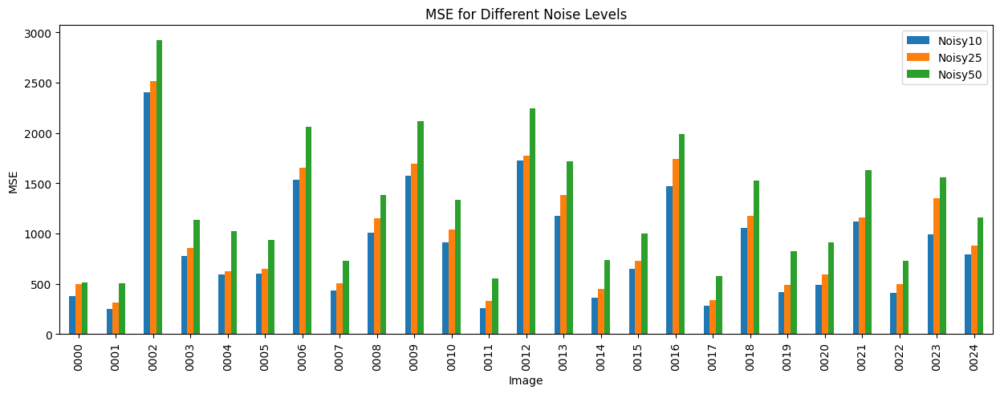

In [35]:
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path

# Initialize dictionaries to store MSE values
mse_values = {'Noisy10': [], 'Noisy25': [], 'Noisy50': []}
image_names = []

for noise_level, denoised_folder in denoised_folders.items():
    original_images = sorted(Path(original_folder).glob('*.png'))
    denoised_images = sorted(Path(denoised_folder).glob('*.png'))

    if len(original_images) != len(denoised_images):
        print(f"Number of original and denoised images does not match in {noise_level}.")
        continue

    for i, (original_image_path, denoised_image_path) in enumerate(zip(original_images, denoised_images)):
        if noise_level == 'Noisy10':  # Add image names only once
            image_names.append(original_image_path.stem)

        original_image = load_image(original_image_path)
        denoised_image = load_image(denoised_image_path)

        # Calculate MSE
        mse_value = mse(original_image, denoised_image)

        mse_values[noise_level].append(mse_value)

# Creating DataFrame for visualization
df_mse = pd.DataFrame(mse_values, index=image_names)

# Plotting MSE for each noise level
df_mse.plot(kind='bar', figsize=(15, 5))
plt.title('MSE for Different Noise Levels')
plt.xlabel('Image')
plt.ylabel('MSE')
plt.show()

#### Structural SIMilarity Index (SSIM)
The SSIM graph illustrates the similarity between the denoised and original images. Higher SSIM values indicate better preservation of the original image structure and quality.

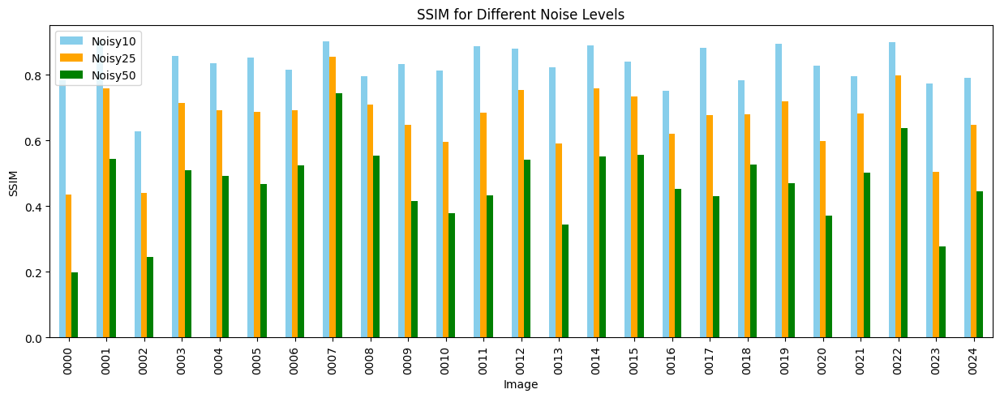

In [36]:
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path

# Initialize dictionaries to store SSIM values
ssim_values = {'Noisy10': [], 'Noisy25': [], 'Noisy50': []}
image_names = []

for noise_level, denoised_folder in denoised_folders.items():
    original_images = sorted(Path(original_folder).glob('*.png'))
    denoised_images = sorted(Path(denoised_folder).glob('*.png'))

    if len(original_images) != len(denoised_images):
        print(f"Number of original and denoised images does not match in {noise_level}.")
        continue

    for i, (original_image_path, denoised_image_path) in enumerate(zip(original_images, denoised_images)):
        if noise_level == 'Noisy10':  # Add image names only once
            image_names.append(original_image_path.stem)

        original_image = load_image(original_image_path)
        denoised_image = load_image(denoised_image_path)

        # Calculate SSIM
        ssim_value = ssim(original_image, denoised_image)

        ssim_values[noise_level].append(ssim_value)

# Creating DataFrame for visualization
df_ssim = pd.DataFrame(ssim_values, index=image_names)

# Plotting SSIM for each noise level
df_ssim.plot(kind='bar', figsize=(15, 5), color=['skyblue', 'orange', 'green'])
plt.title('SSIM for Different Noise Levels')
plt.xlabel('Image')
plt.ylabel('SSIM')
plt.show()

### Sample Images Comparison
Visual inspection of denoised images alongside their original counterparts offers a qualitative assessment of the denoising process. Below are sample images from each noise level, showcasing the denoising algorithm's impact.

NameError: name 'denoised_image_name' is not defined

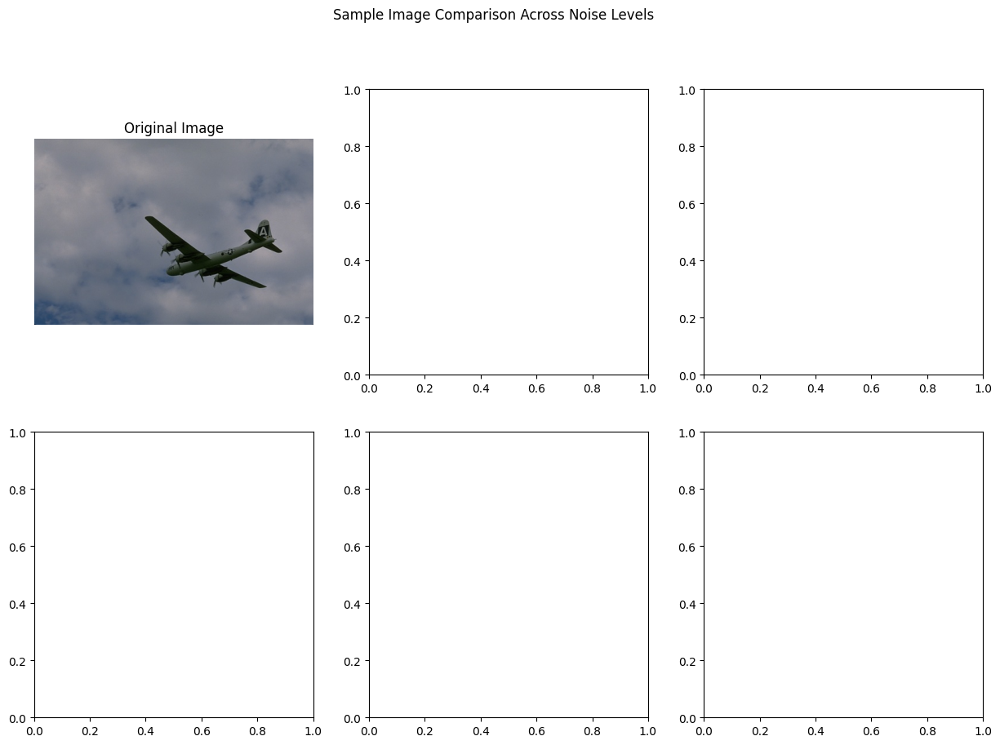

In [37]:
import matplotlib.pyplot as plt
import cv2
from pathlib import Path

# Function to load an image from a given path
def load_image(image_path):
    """Load an image from a file path in color."""
    image = cv2.imread(str(image_path), cv2.IMREAD_COLOR)
    if image is None:
        raise ValueError(f"Image not found at path: {image_path}")
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB format

# Paths to the folders
original_folder = 'original'
noisy_folders = {
    'Noisy10': 'noisy10',
    'Noisy25': 'noisy25',
    'Noisy50': 'noisy50'
}
denoised_folders = {
    'Noisy10': 'denoised_Noisy10',
    'Noisy25': 'denoised_Noisy25',
    'Noisy50': 'denoised_Noisy50'
}

# Sample image name
sample_image_name = '0000.png'  # Noisy image name
denoised_image_prefix = 'denoised_prelim_filtered_'  # Prefix for denoised images

# Display sample images
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Sample Image Comparison Across Noise Levels')

# Load and display the original image
original_image_path = Path(original_folder) / sample_image_name
original_image = load_image(original_image_path)
axes[0, 0].imshow(original_image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Load and display noisy and denoised images for each noise level
for i, noise_level in enumerate(noisy_folders.keys()):
    # Load and display denoised image
    denoised_image_path = Path(denoised_folders[noise_level]) / denoised_image_name
    denoised_image = load_image(denoised_image_path)
    
    if i < 2:
        axes[0, i + 1].imshow(denoised_image, cmap='gray')
        axes[0, i + 1].set_title(f'Denoised Image ({noise_level})')
        axes[0, i + 1].axis('off')
    
    # Load and display noisy image
    noisy_image_path = Path(noisy_folders[noise_level]) / sample_image_name
    noisy_image = load_image(noisy_image_path)
    axes[1, i].imshow(noisy_image, cmap='gray')
    axes[1, i].set_title(f'Noisy Image ({noise_level})')
    axes[1, i].axis('off')

# Display the last denoised image (for i = 2)
if i == 2:
    axes[0, 2].imshow(denoised_image, cmap='gray')
    axes[0, 2].set_title(f'Denoised Image ({noise_level})')
    axes[0, 2].axis('off')

plt.tight_layout()
plt.show()